# DRIVE MOUNT





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !unzip "/content/drive/MyDrive/SKIN/data.zip" -d "/content/drive/MyDrive/SKIN/DATA"

# IMPORT PACKAGES

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import numpy as np
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from skimage.feature import local_binary_pattern
from sklearn.decomposition import PCA

In [ ]:
data_dir = "/content/drive/MyDrive/SKIN/DATA/data/"

class_labels = [
    'actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma',
    'nevus', 'pigmented benign keratosis', 'seborrheic keratosis',
    'squamous cell carcinoma', 'vascular lesion'
]

In [ ]:
class_data = {
    class_labels[i]: os.listdir(data_dir + class_labels[i] + '/') for i in range(len(class_labels))
}

In [ ]:
def loading(img):
    img = cv2.imread(img)
    img = cv2.resize(img, (224, 224))
    return img[..., ::-1]

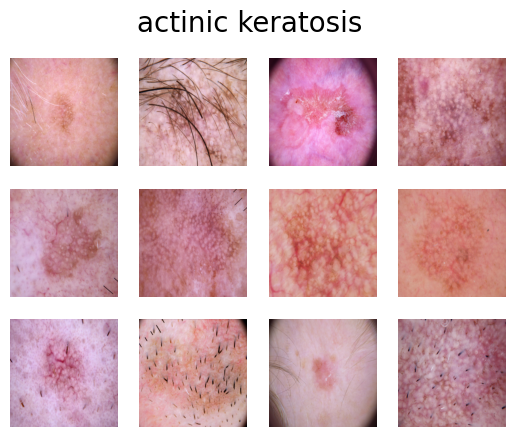

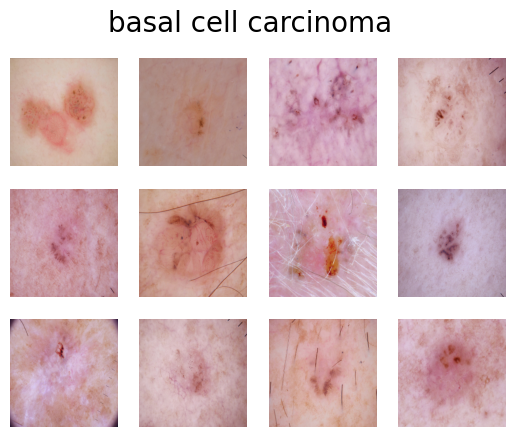

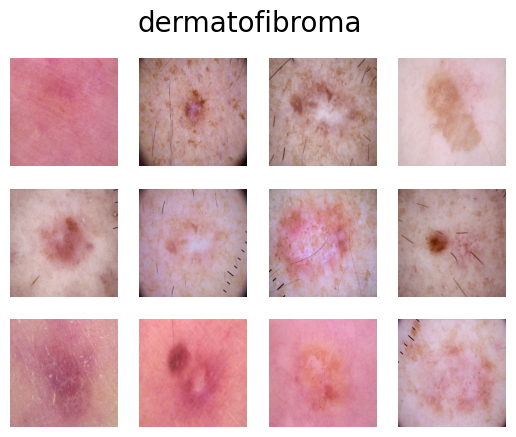

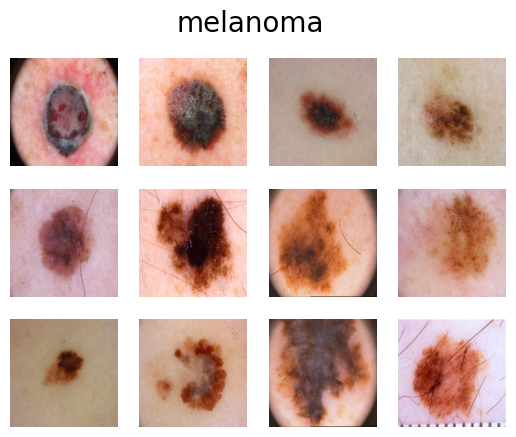

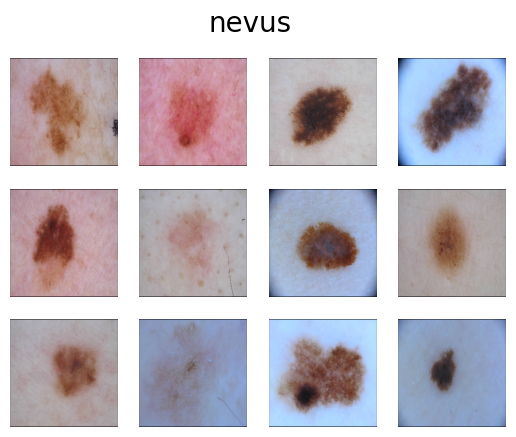

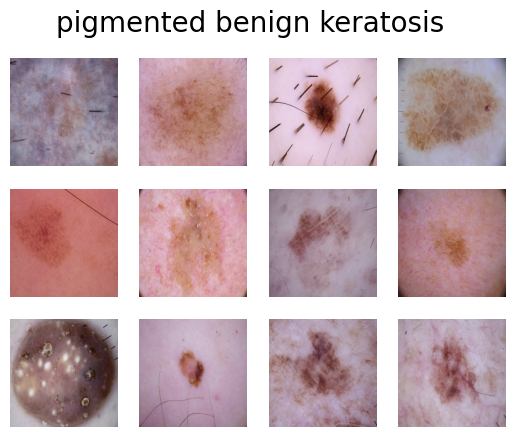

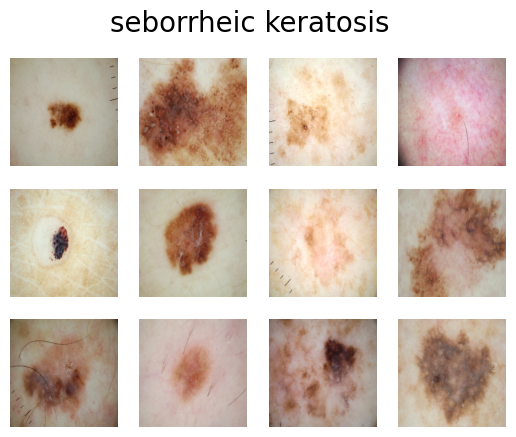

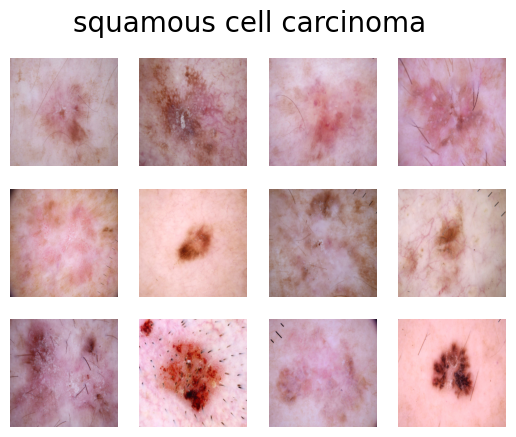

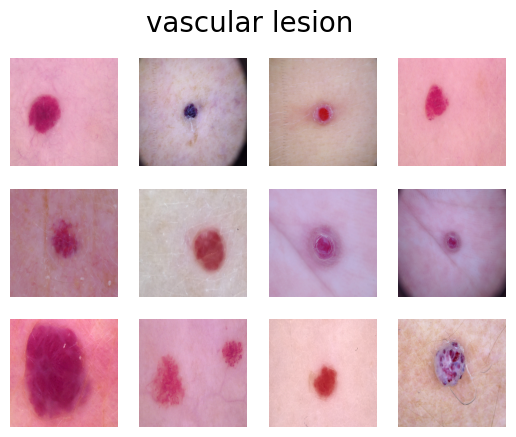

In [ ]:
def plot_images(class_name, data_list):
    for i in range(12):
        plt.subplot(3, 4, i + 1)
        plt.imshow(loading(data_dir + class_name + '/' + data_list[i]), cmap='gray')
        plt.suptitle(class_name, fontsize=20)
        plt.axis('off')
    plt.show()

# Plot images for each class
for class_name, data_list in class_data.items():
    plot_images(class_name, data_list)

In [ ]:
def preprocess_images(data_dir, data_list, label_index):
    for img_name in tqdm(data_list, desc="Preprocessing " + class_labels[label_index]):
        img_path = os.path.join(data_dir, img_name)
        img = loading(img_path)
        images.append(img)
        labels.append(label_index)

In [ ]:
images = []
labels = []

In [ ]:
for class_name, data_list in class_data.items():
    label_index = class_labels.index(class_name)
    preprocess_images(data_dir + class_name + '/', data_list, label_index)

Preprocessing vascular lesion: 100%|██████████| 139/139 [00:37<00:00,  3.67it/s]


In [ ]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

In [ ]:
augmented_images = []
for image in images:
    augmented_image = datagen.random_transform(image)
    augmented_images.append(augmented_image)

In [ ]:
def apply_color_correction(image):
    # Convert BGR to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    # Splitting the LAB image into L, A, and B channels
    l, a, b = cv2.split(lab)
    # Applying CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    # Merge the CLAHE enhanced L channel with the original A and B channels
    merged = cv2.merge((cl, a, b))
    # Convert LAB back to BGR
    color_corrected = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
    return color_corrected

In [ ]:
def Threshold_segmentation(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, segmented = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
    return segmented

In [ ]:
def display_histogram_equalization(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Perform histogram equalization
    equalized = cv2.equalizeHist(gray)
    return equalized

In [ ]:
def apply_lbp(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Compute Local Binary Pattern
    lbp = local_binary_pattern(gray, 8, 1, method='uniform')
    return lbp

In [ ]:
def apply_pca(features, n_components=100):
    # Flatten features
    flat_features = features.reshape(features.shape[0], -1)
    # Apply PCA
    pca = PCA(n_components=n_components)
    pca.fit(flat_features)
    reduced_features = pca.transform(flat_features)
    return reduced_features

LBP and PCA Feature Extraction for actinic keratosis


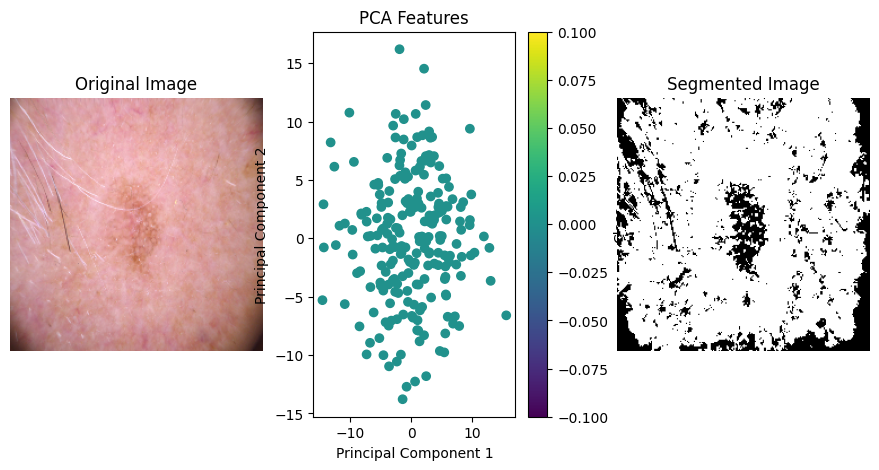

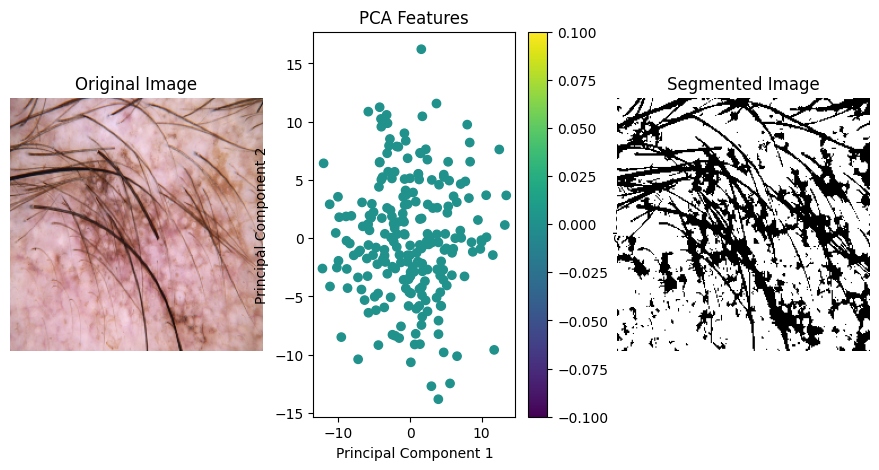

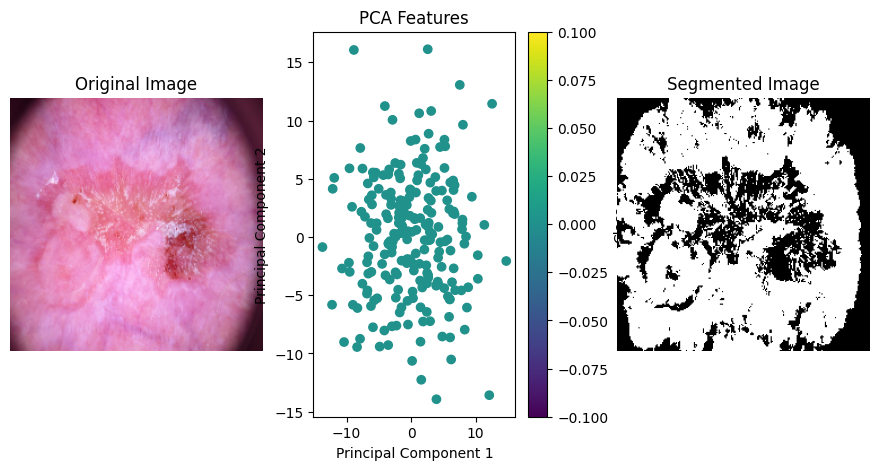

LBP and PCA Feature Extraction for basal cell carcinoma


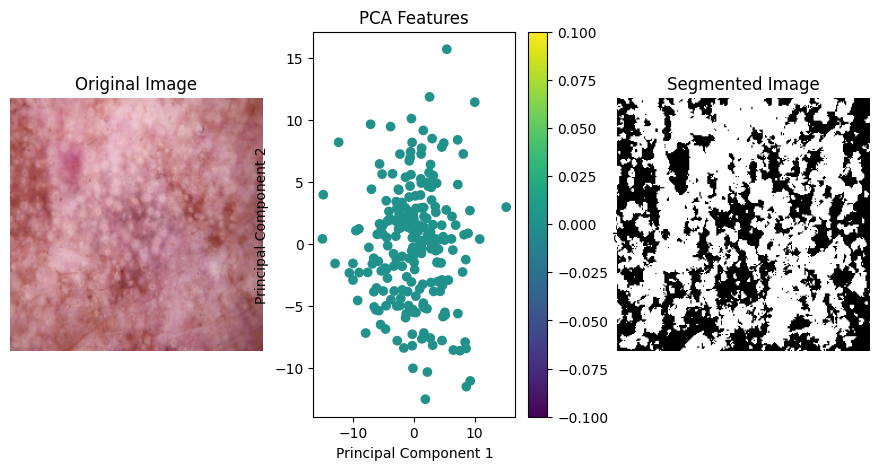

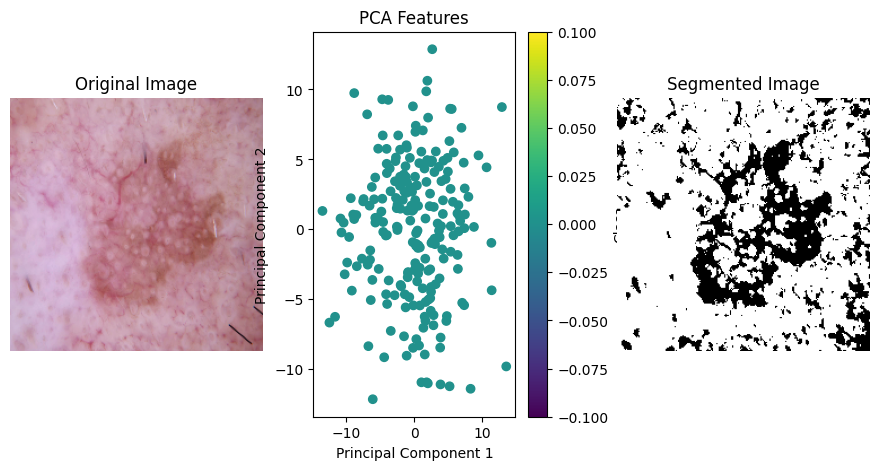

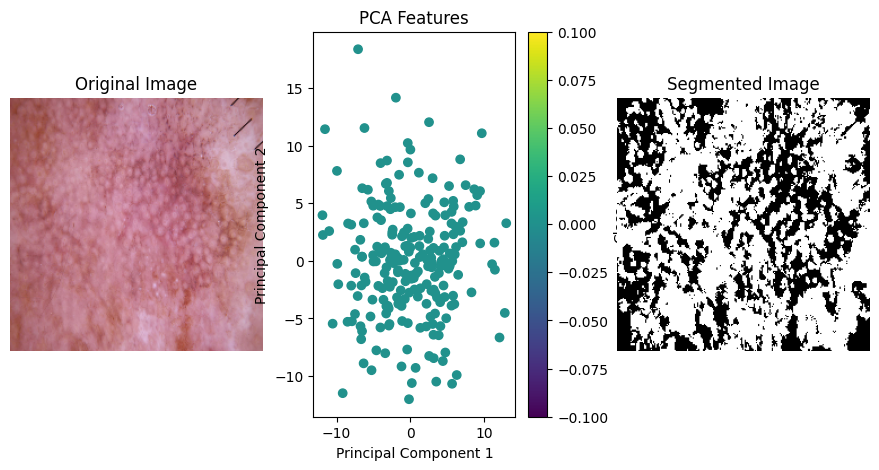

LBP and PCA Feature Extraction for dermatofibroma


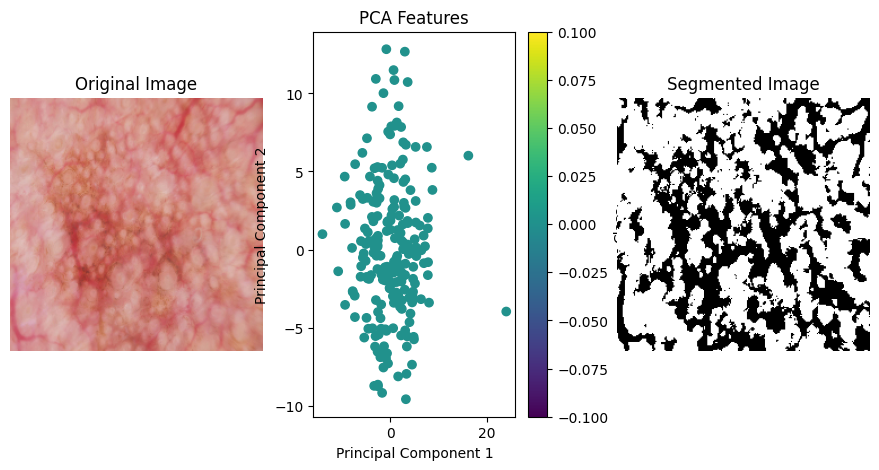

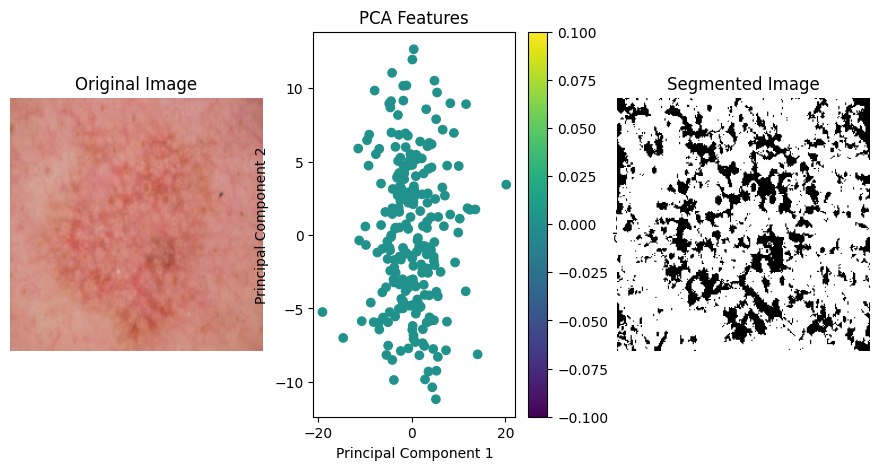

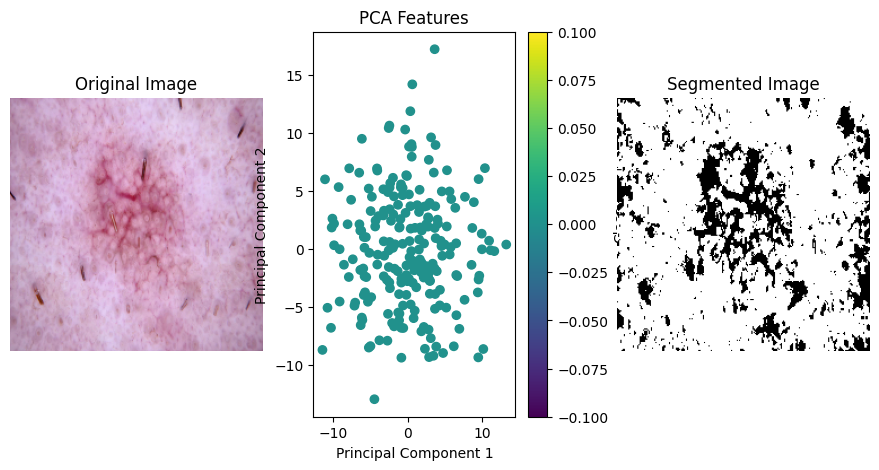

LBP and PCA Feature Extraction for melanoma


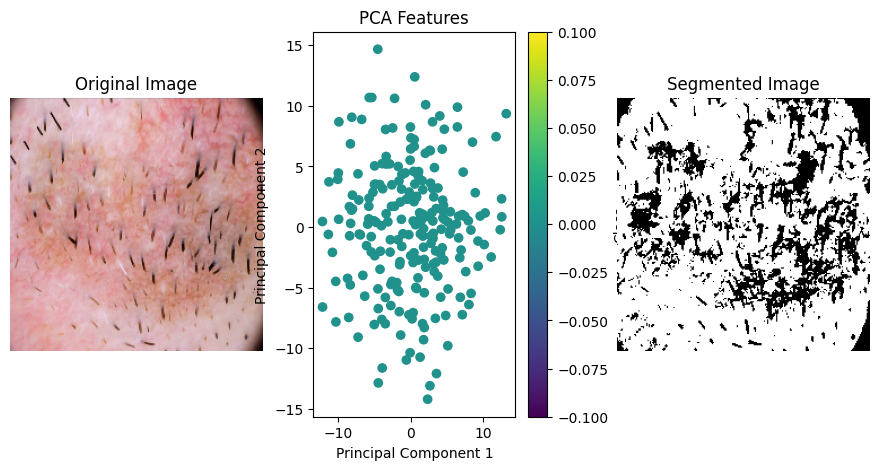

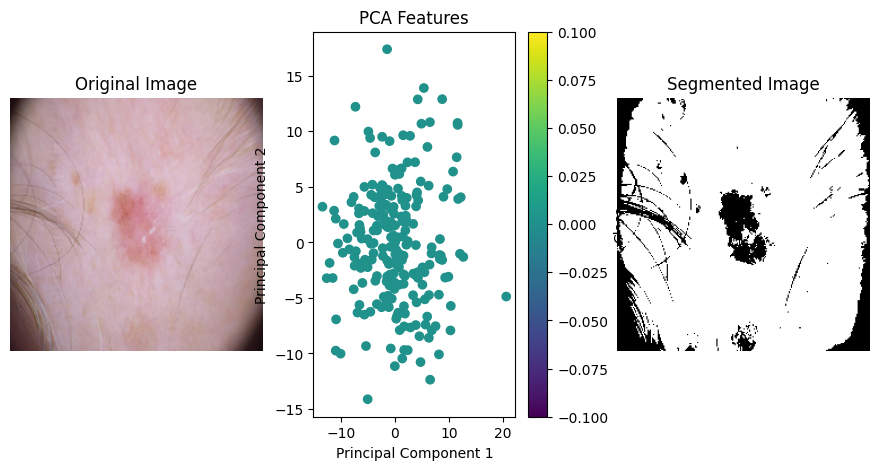

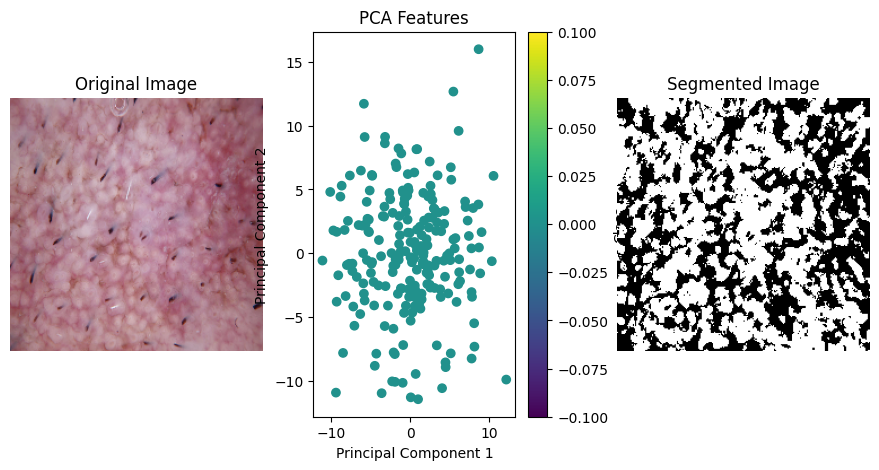

LBP and PCA Feature Extraction for nevus


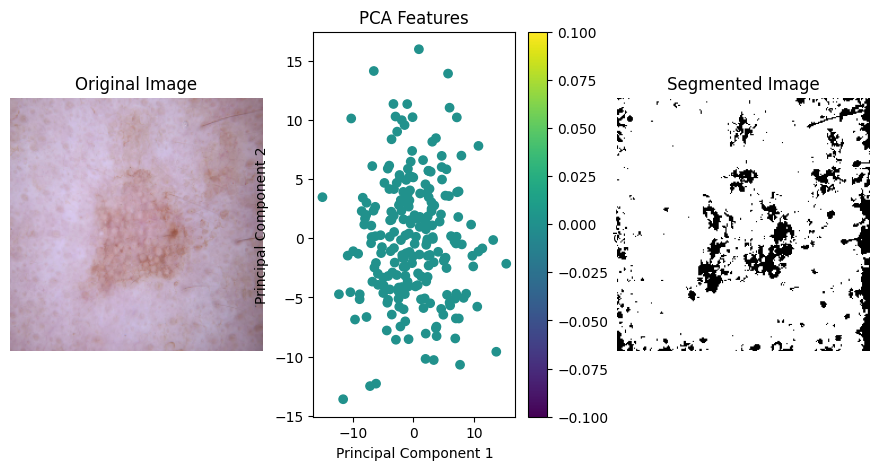

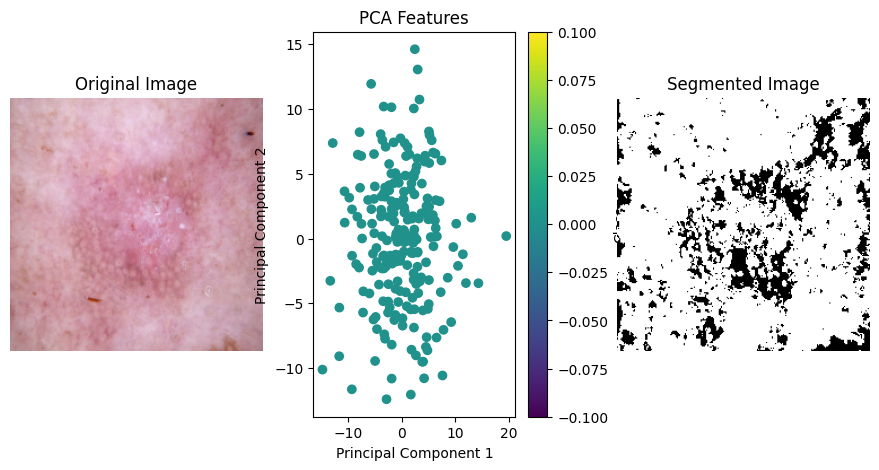

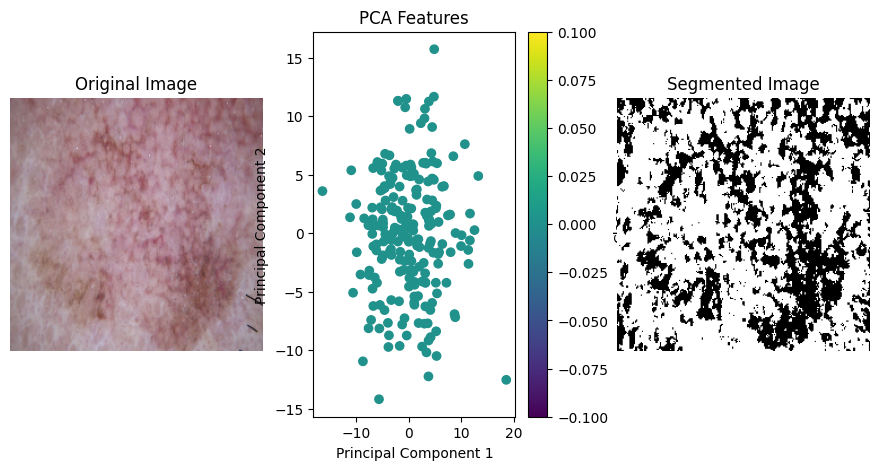

LBP and PCA Feature Extraction for pigmented benign keratosis


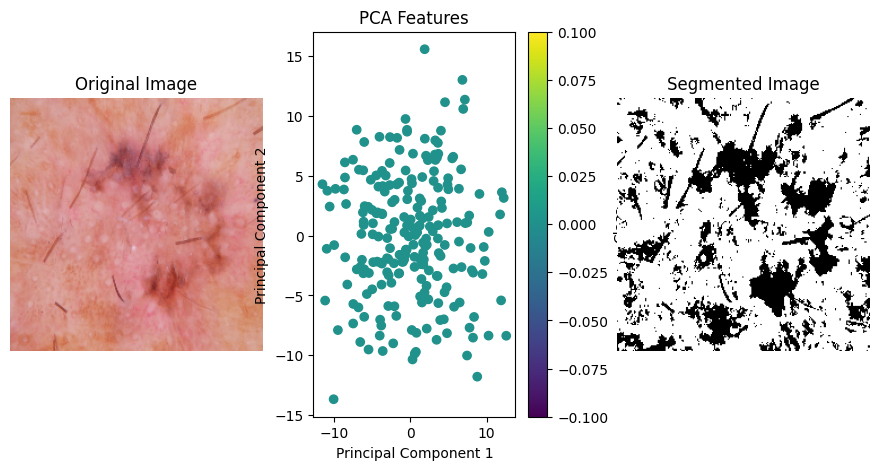

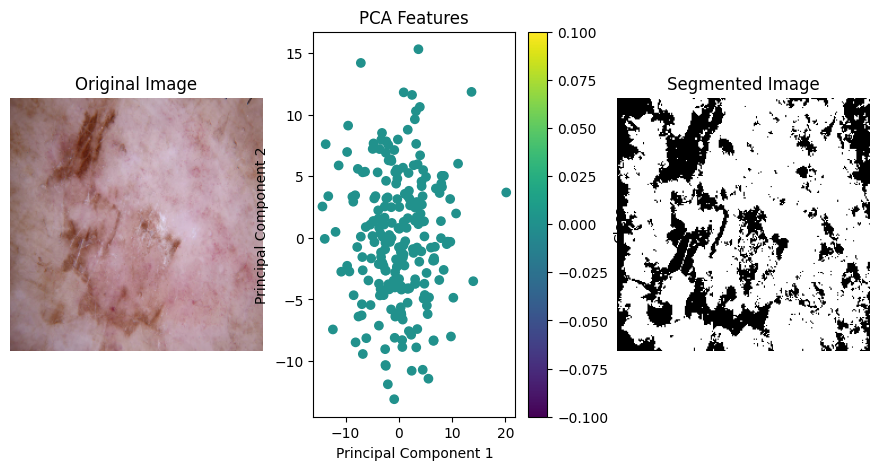

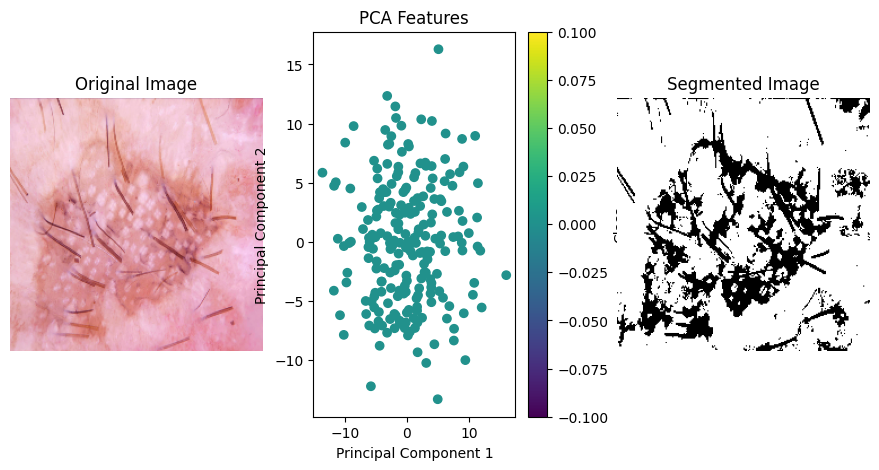

LBP and PCA Feature Extraction for seborrheic keratosis


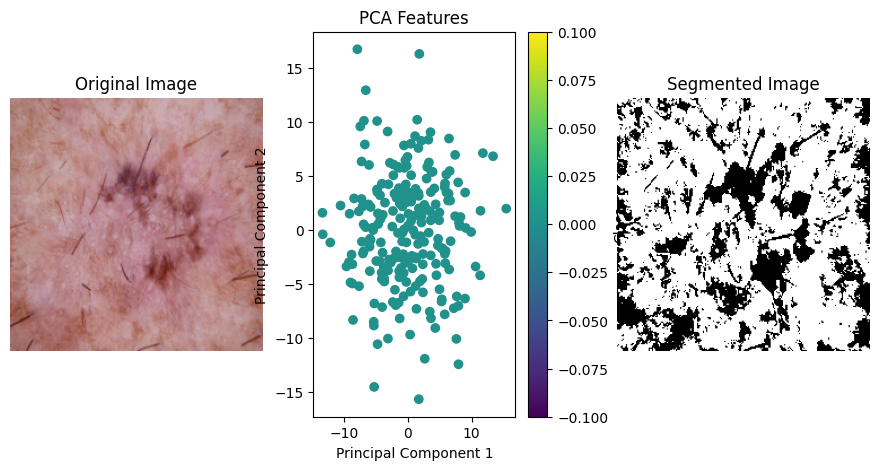

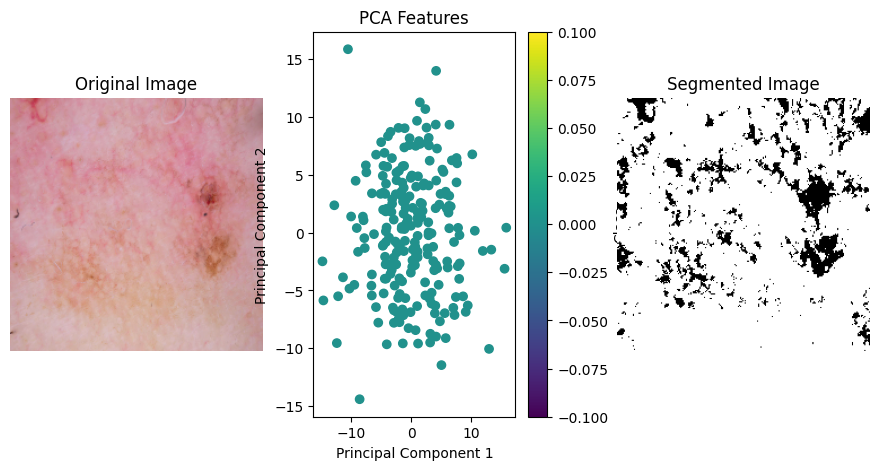

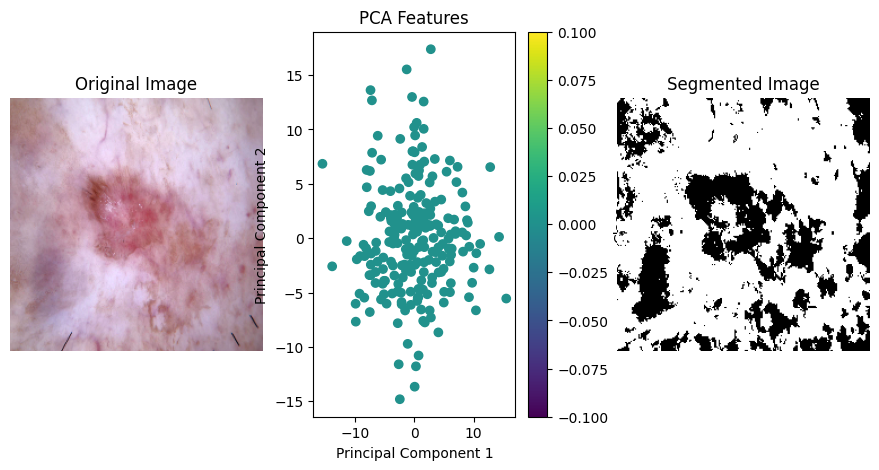

LBP and PCA Feature Extraction for squamous cell carcinoma


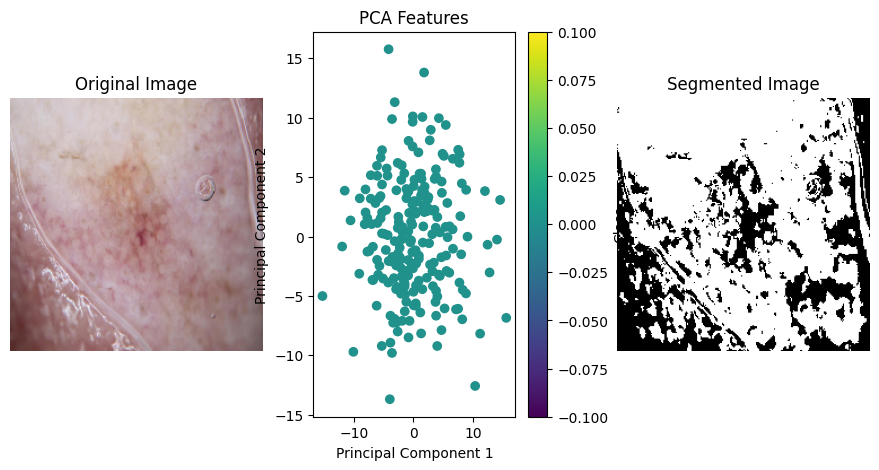

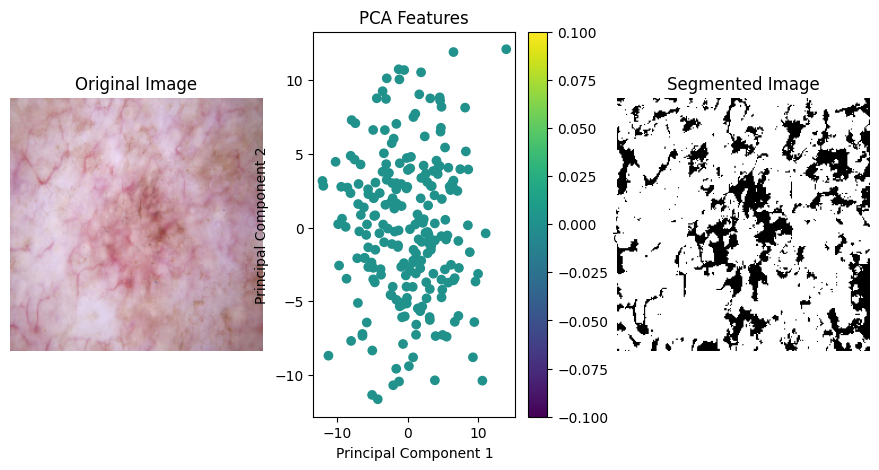

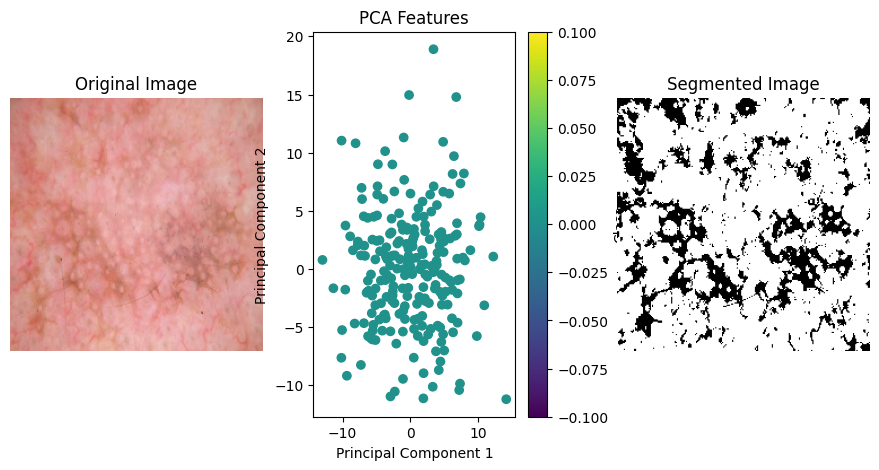

LBP and PCA Feature Extraction for vascular lesion


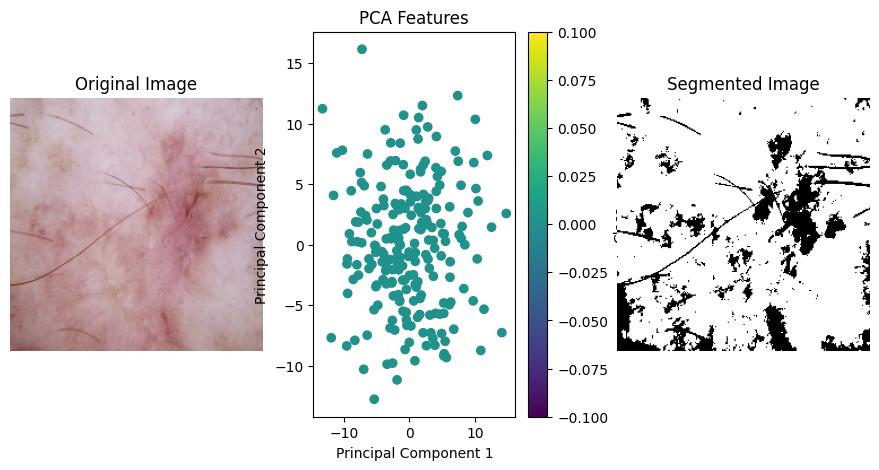

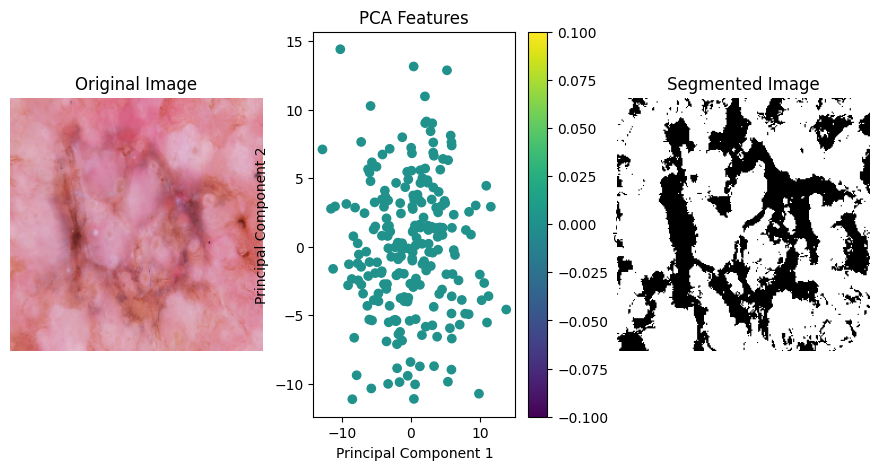

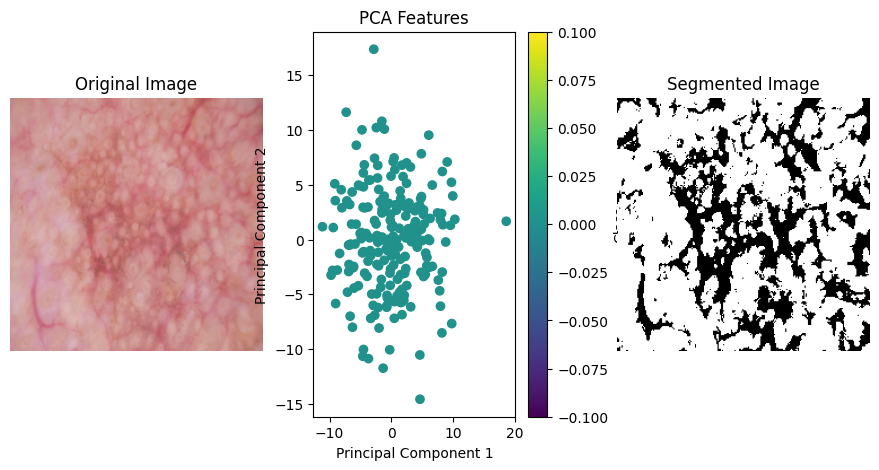

In [ ]:
# Apply LBP and PCA for feature extraction
for i, class_name in enumerate(class_labels):
    print("LBP and PCA Feature Extraction for", class_name)
    for j in range(3):  # Apply to the first 3 images of each class
        plt.figure(figsize=(15, 5))

        # Retrieve image
        image = images[i * 3 + j]

        # Original Image
        plt.subplot(1, 4, 1)
        plt.imshow(image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        # Apply color correction
        color_corrected = apply_color_correction(image)

        # Apply LBP
        lbp_features = apply_lbp(color_corrected)

        # Apply PCA
        pca_features = apply_pca(lbp_features)

        # Display PCA-reduced features
        plt.subplot(1, 4, 2)
        plt.scatter(pca_features[:, 0], pca_features[:, 1], c=[labels[i * 3 + j]] * pca_features.shape[0], cmap='viridis')
        plt.title("PCA Features")
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.colorbar(label='Class')

        # Threshold segmentation
        gray = cv2.cvtColor(color_corrected, cv2.COLOR_BGR2GRAY)
        _, segmented = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

        # Display Segmented Image
        plt.subplot(1, 4, 3)
        plt.imshow(segmented, cmap='gray')
        plt.title("Segmented Image")
        plt.axis('off')

        plt.show()


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
images_array = np.array(images)
labels_array = np.array(labels)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_array, labels_array, test_size=0.2, random_state=42)

In [ ]:
print("Training Set Shape:", X_train.shape, y_train.shape)
print("Testing Set Shape:", X_test.shape, y_test.shape)

Training Set Shape: (1791, 224, 224, 3) (1791,)
Testing Set Shape: (448, 224, 224, 3) (448,)


In [ ]:
from tensorflow.keras.applications import EfficientNetB0, DenseNet121, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import SparseCategoricalAccuracy

input_shape = (224, 224, 3)

efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

def compile_model(model):
    model.compile(optimizer=Adam(),
                  loss=SparseCategoricalCrossentropy(),
                  metrics=[SparseCategoricalAccuracy()])

def build_hybrid_model(backbones):
    # Input layers for each backbone
    inputs = [backbone.input for backbone in backbones]

    # Extract features from each backbone
    features = [GlobalAveragePooling2D()(backbone.output) for backbone in backbones]

    # Concatenate features
    concatenated = Concatenate()(features)

    # Dense layer with ReLU activation
    x = Dense(512, activation='relu')(concatenated)

    # Output layer with softmax activation
    output = Dense(len(class_labels), activation='softmax')(x)

    # Create the model
    model = Model(inputs=inputs, outputs=output)
    return model

# Rename layers to avoid duplicate names
for layer in efficientnet.layers:
    layer._name = f'efficientnet_{layer.name}'
for layer in densenet.layers:
    layer._name = f'densenet_{layer.name}'
for layer in resnet.layers:
    layer._name = f'resnet_{layer.name}'

# Build the hybrid model using EfficientNet, DenseNet, and ResNet
hybrid_model = build_hybrid_model([efficientnet, densenet, resnet])

# Compile the hybrid model
compile_model(hybrid_model)

# Print the summary of the hybrid model
print("Hybrid Model Summary:")
hybrid_model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Hybrid Model Summary:
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 densenet_input_2 (InputLay  [(None, 224, 224, 3)]        0         []                            
 er)                                                                                              
                                                                                                  
 densenet_zero_padding2d (Z  (None, 230, 230, 3)          0         ['densenet_input_2[0][0]']    
 eroPadding2D)                                                                                    
                                                                                                  
 densenet_conv1/conv (Conv2  (None, 112, 112, 64)         9408      ['densenet_zero_padding2d[0][0
 D)    

In [ ]:
# Fit the model
history = hybrid_model.fit([X_train, X_train, X_train], y_train,
                           validation_data=([X_test, X_test, X_test], y_test),
                           epochs=50, batch_size=32)

Epoch 1/50
56/56 [==============================] - 235s 1s/step - loss: 1.4837 - sparse_categorical_accuracy: 0.5472 - val_loss: 121.3528 - val_sparse_categorical_accuracy: 0.2121
Epoch 2/50
56/56 [==============================] - 63s 1s/step - loss: 0.8676 - sparse_categorical_accuracy: 0.7052 - val_loss: 35.9599 - val_sparse_categorical_accuracy: 0.1719
Epoch 3/50
56/56 [==============================] - 65s 1s/step - loss: 0.6630 - sparse_categorical_accuracy: 0.7683 - val_loss: 6.3056 - val_sparse_categorical_accuracy: 0.4420
Epoch 4/50
56/56 [==============================] - 63s 1s/step - loss: 0.5041 - sparse_categorical_accuracy: 0.8118 - val_loss: 1.3113 - val_sparse_categorical_accuracy: 0.6406
Epoch 5/50
56/56 [==============================] - 64s 1s/step - loss: 0.3984 - sparse_categorical_accuracy: 0.8431 - val_loss: 1.7578 - val_sparse_categorical_accuracy: 0.6071
Epoch 6/50
56/56 [==============================] - 63s 1s/step - loss: 0.3751 - sparse_categorical_accura

In [ ]:
hybrid_model.save("/content/drive/MyDrive/SKIN/model/hybrid_skin_classifier.h5")

ValueError: Unable to create dataset (name already exists)

14/14 [==============================] - 3s 225ms/step - loss: 1.7733 - sparse_categorical_accuracy: 0.6473
Test Loss: 1.7732570171356201
Test Accuracy: 0.6473214030265808


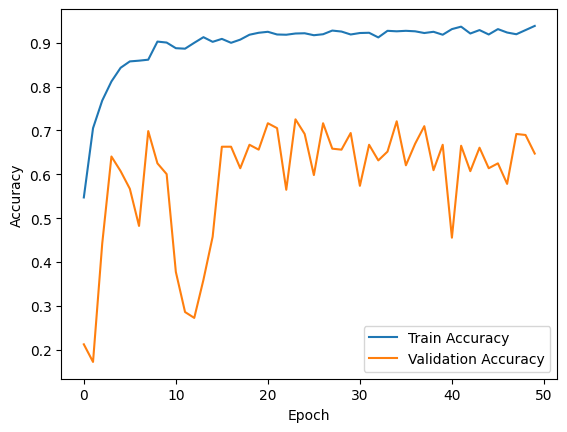

In [ ]:
# Evaluate the model
evaluation = hybrid_model.evaluate([X_test, X_test, X_test], y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plot training history
plt.plot(history.history['sparse_categorical_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

56/56 [==============================] - 24s 336ms/step - loss: 0.1147 - sparse_categorical_accuracy: 0.9375
Test Loss: 0.11465420573949814
Test Accuracy: 0.9374651312828064


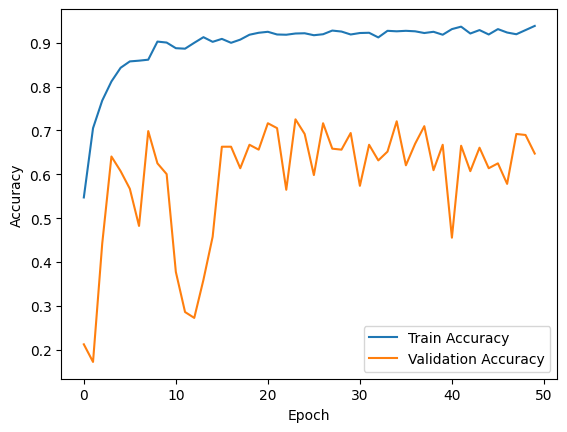

In [ ]:
# Evaluate the model
evaluation = hybrid_model.evaluate([X_train, X_train, X_train], y_train)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plot training history
plt.plot(history.history['sparse_categorical_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Predict labels for the test set
y_pred = hybrid_model.predict([X_train, X_train, X_train])
y_pred = np.argmax(y_pred, axis=1)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)

# Generate classification report
class_report = classification_report(y_train, y_pred, target_names=class_labels)

# Print confusion matrix and classification report
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

56/56 [==============================] - 17s 228ms/step
Confusion Matrix:
[[ 94   0   0   0   0   0   0   0   0]
 [  0 281   0   2   0   0   0   0   0]
 [  0   0  75   0   0   0   0   0   0]
 [  0   0   0 299   0   0  61   0   0]
 [ 44   0   0   0 244   0   0   0   0]
 [  0   0   0   1   0 363   0   2   0]
 [  0   0   0   0   0   0  59   0   0]
 [  1   0   0   1   0   0   0 149   0]
 [  0   0   0   0   0   0   0   0 115]]

Classification Report:
                            precision    recall  f1-score   support

         actinic keratosis       0.68      1.00      0.81        94
      basal cell carcinoma       1.00      0.99      1.00       283
            dermatofibroma       1.00      1.00      1.00        75
                  melanoma       0.99      0.83      0.90       360
                     nevus       1.00      0.85      0.92       288
pigmented benign keratosis       1.00      0.99      1.00       366
      seborrheic keratosis       0.49      1.00      0.66        59
   sq

In [ ]:
# from keras.models import load_model
# model = load_model('model.h5')

In [ ]:
import cv2

def preprocess_image(image_path):
    # Load the image using OpenCV
    image = cv2.imread(image_path)
    # Resize the image to match the input shape of the model
    image = cv2.resize(image, (224, 224))
    # Convert the image to the format expected by the model
    image = image.astype('float32') / 255.0
    # Add an extra dimension to represent the batch size (required by the model)
    image = np.expand_dims(image, axis=0)
    return image

In [ ]:
def predict_single_image(image_path, model):
    # Preprocess the image
    image = preprocess_image(image_path)
    # Perform prediction
    predictions = hybrid_model.predict(image)
    # Get the predicted class index
    predicted_class_index = np.argmax(predictions[0])
    # Map the class index to the corresponding label
    class_labels = [
        'actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma',
        'nevus', 'pigmented benign keratosis', 'seborrheic keratosis',
        'squamous cell carcinoma', 'vascular lesion'
    ]
    predicted_class = class_labels[predicted_class_index]
    return predicted_class

In [ ]:
image_path = '/content/drive/MyDrive/SKIN/DATA/data/actinic keratosis/ISIC_0025780.jpg'  # Update with the path to your image
predicted_class = predict_single_image(image_path,hybrid_model)
print("Predicted class:", predicted_class)

ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2440, in predict_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2425, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2413, in run_step  **
        outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2381, in predict_step
        return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/input_spec.py", line 219, in assert_input_compatibility
        raise ValueError(

    ValueError: Layer "model" expects 3 input(s), but it received 1 input tensors. Inputs received: [<tf.Tensor 'IteratorGetNext:0' shape=(None, 224, 224, 3) dtype=float32>]
